# Présentation des résultats

Chargement des Packages nécessaires

In [1]:
using CSV
using DataFrames
using DataFramesMeta
using Dates
using StatsPlots
using Statistics
using Temporal
using GLM
using TimeSeries: TimeArray 
using StatsBase
using Forecast
using LinearAlgebra

Données

In [2]:
# Charger les données
df = CSV.read("data_station_extract_script/data_tx/MONTPELLIER.txt", DataFrame, skipto = 22, header = 21, comment="#", dateformat = "yyyymmdd", types=Dict(:DATE => Date), normalizenames=true)
df_drias = CSV.read("data_drias/Mod1_temp/Montpellier.txt",DataFrame, header = 60, comment="#", dateformat = "yyyymmdd", types=Dict(:Date => Date), normalizenames=true)

# Filtrer les données entre 1951 et 2006
df_filtered = filter(row -> year(row.DATE) >= 1955 && year(row.DATE) <= 2005, df)
df_filtered_drias = filter(row -> year(row.Date) >= 1955 && year(row.Date) <= 2005, df_drias)

,Date,Tmin,Tmax,Tmoy
,Date,Float64,Float64,Float64
1,1955-01-01,3.66,10.3,6.13
2,1955-01-02,1.94,12.39,6.97
3,1955-01-03,5.5,13.68,9.41
4,1955-01-04,3.96,11.02,6.39
5,1955-01-05,2.4,10.87,6.55
6,1955-01-06,6.07,15.11,11.83
7,1955-01-07,9.93,13.33,11.73
8,1955-01-08,7.72,14.77,12.19
9,1955-01-09,5.53,13.42,8.49


## Premières Analyses

### Moyenne en regroupant les mois


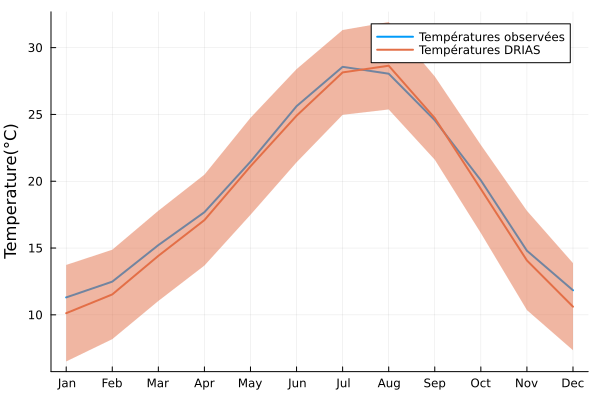

In [4]:
# Conversion factor to °C
factor = 0.1

df_month = @chain df_filtered begin
    @subset(:Q_TX .!= 9) # remove missing 
    @transform(:MONTH = month.(:DATE)) # add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TX)*factor, :MONTHLY_STD = std(:TX)*factor) # grouby MONTH + takes the mean/std in each category 
end
df_month_drias = @chain df_filtered_drias begin
    @subset(:Tmax .!= 9) # remove missing 
    @transform(:MONTH = month.(:Date)) # add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:Tmax), :MONTHLY_STD = std(:Tmax)) # grouby MONTH + takes the mean/std in each category 
end


@df df_month plot(monthabbr.(1:12), :MONTHLY_MEAN, label = "Températures observées", linewidth=2)
ylabel!("Temperature(°C)")
@df df_month_drias plot!(monthabbr.(1:12), :MONTHLY_MEAN, ribbon = :MONTHLY_STD, label = "Températures DRIAS", linewidth=2)
ylabel!("Temperature(°C)")

### Autocorrélogrammes

Ajustement des données

In [6]:
# Calculer la moyenne et l'écart type pour chaque date
df_daily = @chain df_filtered begin
    @subset(:Q_TX .!= 9) # Supprimer les valeurs manquantes 
    @transform(:YEAR = year.(:DATE)) # Ajouter une colonne pour l'année
    @by(:DATE, :DAILY_MEAN = mean(:TX)*factor, :DAILY_STD = std(:TX)*factor) # Grouper par DATE et prendre la moyenne / écart type
end
# Calculer la moyenne et l'écart type pour chaque date
df_daily_drias = @chain df_filtered_drias begin
    @subset(:Tmax .!= 9) # Supprimer les valeurs manquantes 
    @transform(:YEAR = year.(:Date)) # Ajouter une colonne pour l'année
    @by(:Date, :DAILY_MEAN = mean(:Tmax), :DAILY_STD = std(:Tmax)) # Grouper par DATE et prendre la moyenne / écart type
end
# Convertir les données en une série temporelle avec TimeSeries
my_ts = TimeArray(df_daily.DATE, df_daily.DAILY_MEAN)
my_ts_drias = TimeArray(df_daily_drias.Date, df_daily_drias.DAILY_MEAN)

# Extraire les valeurs numériques de la série temporelle
data_values = values(my_ts)
data_values_drias = values(my_ts_drias)

20082-element Vector{Float64}:
  5.74
  5.42
  5.87
  5.95
  5.39
  4.98
  4.11
  5.19
  5.12
 12.64
  ⋮
 12.97
 14.08
 14.69
 12.2
  8.58
  7.95
  9.79
  8.87
  9.1

AUTOCORRÉLOGRAMME PARTIEL


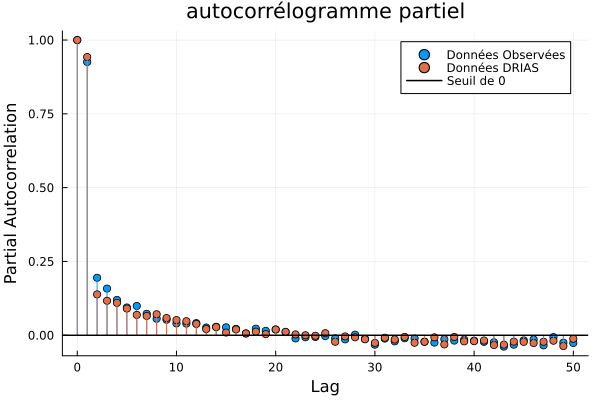

In [7]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values = StatsBase.pacf(data_values, lags)
pacf_values_drias = StatsBase.pacf(data_values_drias, lags)

plot(0:maxlag, pacf_values, label = "Données Observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

AUTOCORRÉLOGRAMME EMPIRIQUE

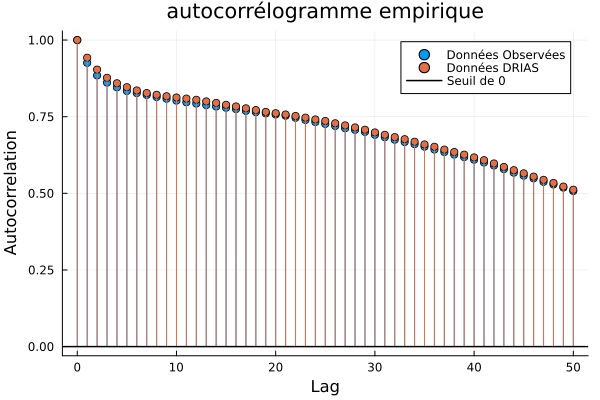

In [8]:
autocor_values = autocor(data_values, lags)
autocor_values_drias = autocor(data_values_drias, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="autocorrélogramme empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

### Séries temporelles et tendances

Tracé des deux avec moyennes mobiles classiques

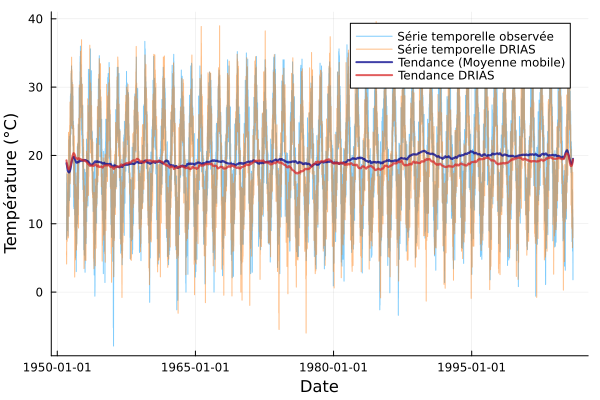

In [9]:
function moyenne_mobile(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, i + window_size ÷ 2)
        trend[i] = mean(@view(data[start_idx:end_idx]))
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_values = moyenne_mobile(df_daily.DAILY_MEAN, 730)
trend_values_drias = moyenne_mobile(df_daily_drias.DAILY_MEAN, 730)

# Convertir les données en une série temporelle
datats = TimeArray(df_daily.DATE, df_daily.DAILY_MEAN)
datats_drias = TimeArray(df_daily_drias.Date, df_daily_drias.DAILY_MEAN)

# Tracer la série temporelle avec la tendance
plot(datats,  alpha=:0.5,label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias,   palette =:tab10, alpha=:0.5, label="Série temporelle DRIAS", xlabel="Date", ylabel="Température (°C)")
plot!(df_daily.DATE, color=:darkblue,alpha=:0.75, trend_values, label="Tendance (Moyenne mobile)", linewidth=2)
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_values_drias, label="Tendance DRIAS", linewidth=2)


Tracé des deux avec moyennes mobiles gaussien


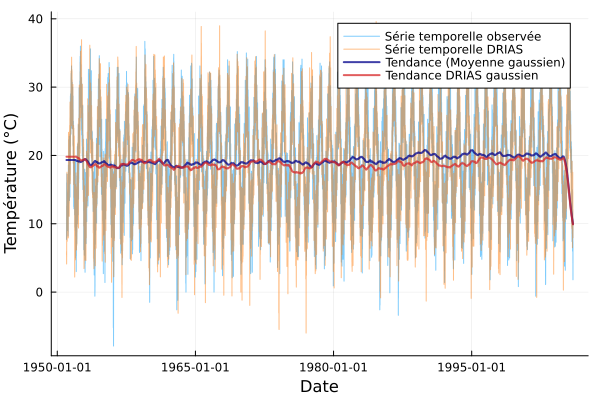

In [10]:

function moyenne_gauss(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        weights = exp.(-(collect(1:window_size) .- (window_size ÷ 2)).^2 / (2 * (window_size / 2)^2))
        weights /= sum(weights)  # Normalisation des poids pour que leur somme soit égale à 1
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, start_idx + window_size - 1)  # Ajustement de la fin de la tranche de données
        data_slice = @view(data[start_idx:end_idx])
        trend[i] = sum(data_slice .* weights[1:length(data_slice)])
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_gauss = moyenne_gauss(df_daily.DAILY_MEAN, 730)
trend_gauss_drias = moyenne_gauss(df_daily_drias.DAILY_MEAN, 730)

# Tracer la série temporelle avec la tendance
plot(datats, alpha=:0.5, label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias, palette =:tab10,alpha=:0.5,label="Série temporelle DRIAS", legend=:topright)
plot!(df_daily.DATE, color=:darkblue,alpha=:0.75,trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)


Calcul des tendances avec le package Forecast

In [11]:
stl_df = stl(df_daily,730; robust=true, spm=true)
stl_df_drias = stl(df_daily_drias,730; robust=true, spm=true)
stl_df.decomposition
stl_df_drias.decomposition

┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165


,Timestamp,Seasonal,Trend,Remainder
,Date,Float64,Float64,Float64
1,1951-01-01,-10.0743,19.5823,-3.76796
2,1951-01-02,-9.94889,19.5826,-4.21376
3,1951-01-03,-9.82762,19.583,-3.88542
4,1951-01-04,-9.71043,19.5834,-3.92301
5,1951-01-05,-9.59721,19.5838,-4.59663
6,1951-01-06,-9.48786,19.5842,-5.11638
7,1951-01-07,-9.38227,19.5846,-6.09236
8,1951-01-08,-9.28032,19.585,-5.11471
9,1951-01-09,-9.18189,19.5854,-5.28354


Tracé des deux avec moyennes mobiles du package Forecast


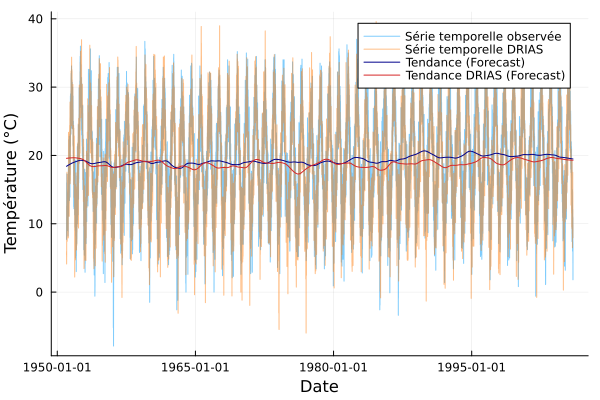

In [12]:
plot(datats, alpha=:0.5, main = "Tendances", label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
plot!(datats_drias,palette =:tab10,alpha=:0.5, label="Série temporelle DRIAS", legend=:topright)
@df stl_df.decomposition plot!(:Timestamp, :Trend, label="Tendance (Forecast)", color=:darkblue)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance DRIAS (Forecast)",palette =:tab10)

Comparaison des différentes méthodes des tendances

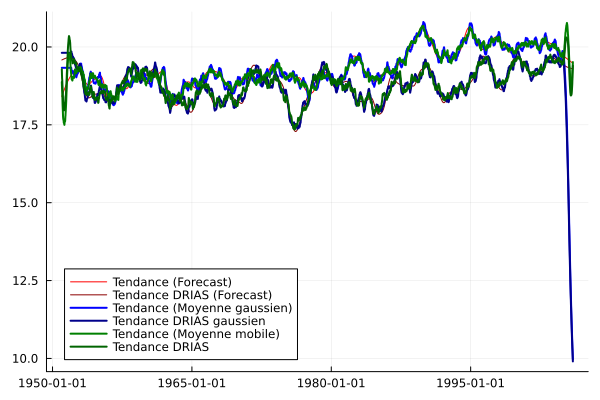

In [13]:
@df stl_df.decomposition plot(:Timestamp, :Trend,  main = "Tendances", label="Tendance (Forecast)", color=:red)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance DRIAS (Forecast)", color=:darkred)

plot!(df_daily.DATE, color=:blue, trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)
plot!(df_daily_drias.Date, color=:darkblue,trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)

plot!(df_daily.DATE, color=:green, palette =:tab10, trend_values, label="Tendance (Moyenne mobile)", linewidth=2)
plot!(df_daily_drias.Date, color=:darkgreen, palette =:tab10, trend_values_drias, label="Tendance DRIAS", linewidth=2)

### SAISONNALITÉ

Calcul à la main d'une saisonnalité

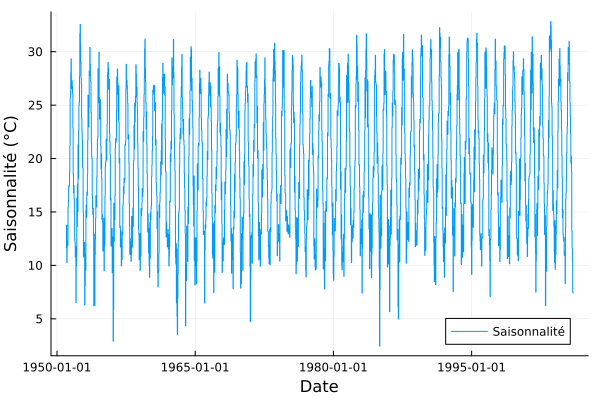

In [14]:

function saisonnalite(data::Vector{T}, period::Int) where T
    n = length(data)
    seasonal = similar(data, T) # Vecteur de la même taille et du meme type que data 
    seasonal_count = Int(ceil(n / period))
    
    seasonal_avg = similar(data, T)
    for i in 1:seasonal_count
        start_idx = (i - 1) * period + 1
        end_idx = min(i * period, n)
        seasonal_avg[start_idx:end_idx] .= mean(@view(data[start_idx:end_idx]))
    end
    
    for i in 1:n
        seasonal[i] = seasonal_avg[i]
    end
    
    return seasonal
end

# Calculer la saisonnalité avec une période saisonnière de 12 mois (par exemple)
seasonal_values = saisonnalite(df_daily.DAILY_MEAN, 12)

# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, seasonal_values, label="Saisonnalité", xlabel="Date", ylabel="Saisonnalité (°C)")


Saisonnalité avec Forecast

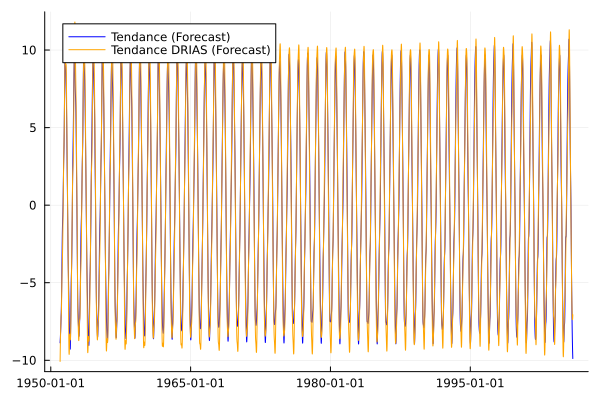

In [15]:
@df stl_df.decomposition plot(:Timestamp, :Seasonal,  main = "Tendances", label="Tendance (Forecast)", color=:blue)
@df stl_df_drias.decomposition plot!(:Timestamp, :Seasonal, label="Tendance DRIAS (Forecast)", color=:orange)

### BRUIT

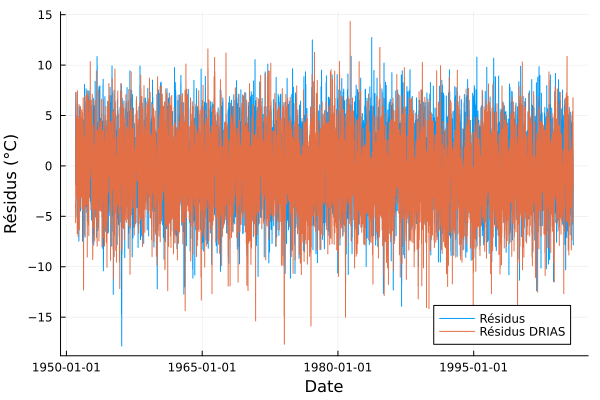

In [16]:

function retiresaisonnalite(data::Vector{T}) where T
    n = length(data)
    saisonnalite = stl_df.decomposition.Seasonal
    tendance = stl_df.decomposition.Trend
    
    for i in 1:n
        data[i] = data[i] - saisonnalite[i] - tendance[i]
    end
    
    return data
end

# Calculer la saisonnalité 
residus = retiresaisonnalite(df_daily.DAILY_MEAN)
residus_drias = retiresaisonnalite(df_daily_drias.DAILY_MEAN)


# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, residus, label="Résidus", xlabel="Date", ylabel="Résidus (°C)")
plot!(df_daily_drias.Date, residus_drias, label="Résidus DRIAS", xlabel="Date", ylabel="Résidus (°C)")

## Analyse des résidus

### Autocorrélogrammes de la série résiduelle

Autocorrélogramme partiel


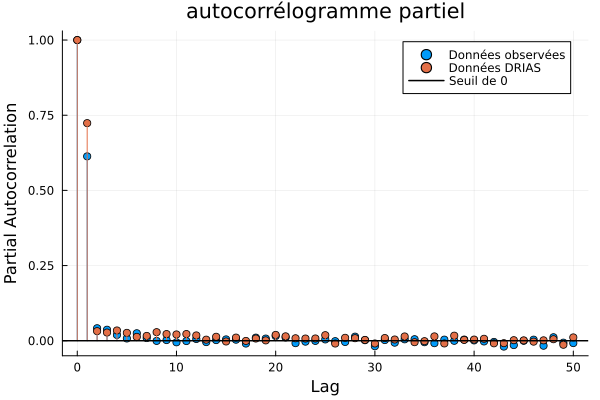

In [17]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values_res = StatsBase.pacf(residus, lags)
pacf_values_drias_res = StatsBase.pacf(residus_drias, lags)

plot(0:maxlag, pacf_values_res, label = "Données observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias_res, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

Autocorrélogramme simple


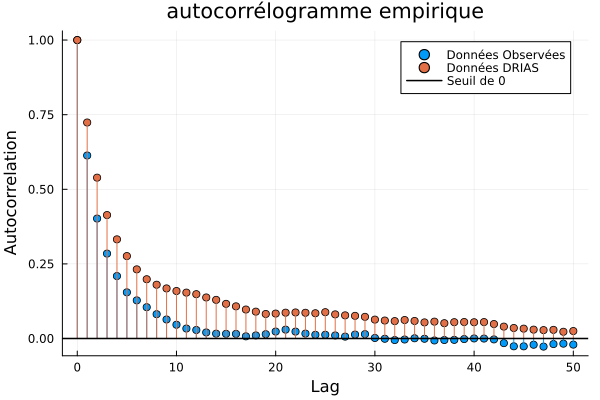

In [18]:
autocor_values = autocor(residus, lags)
autocor_values_drias = autocor(residus_drias, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="autocorrélogramme empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

### Estimation des coefficients de l'AR(2)

Avec notre code


In [25]:
# Construire les matrices pour l'ajustement AR(2)
n = length(residus)
X = hcat(residus[2:end-1], residus[1:end-2])
X_drias = hcat(residus_drias[2:end-1], residus_drias[1:end-2])
y_target = residus[3:end]
y_target_drias = residus_drias[3:end]

# Estimer les coefficients en utilisant les moindres carrés
coefficients = X \ y_target
coefficients_drias = X_drias \ y_target_drias


# Afficher les coefficients estimés
println("Coefficients historiques estimés : ", coefficients)
println("Coefficients estimés pour DRIAS: ", coefficients_drias)



Coefficients historiques estimés : [0.5877626570152831, 0.04154797431847347]
Coefficients estimés pour DRIAS: [0.7043662209349513, 0.03554068754870659]


Données historiques avec Forecast


In [27]:
# Ajuster un modèle AR(2) sur les résidus
model = ar(residus, 2)
model_drias = ar(residus_drias, 2)

# Afficher les résultats
println(model)
println(model_drias)


Multivariate Autoregressive Model

    ar(X, order=2, constant=true)

Residuals Summary
┌──────────┬─────────┬──────────┬────────────┬──────────────┬─────────┬─────────┬──────────────┐
│ Variable │     Min │       1Q │     Median │         Mean │      3Q │     Max │    H0 Normal │
├──────────┼─────────┼──────────┼────────────┼──────────────┼─────────┼─────────┼──────────────┤
│       x1 │ -17.238 │ -1.48057 │ -0.0277224 │ -9.13515e-17 │ 1.49562 │ 12.0529 │ 9.29541e-114 │
└──────────┴─────────┴──────────┴────────────┴──────────────┴─────────┴─────────┴──────────────┘
┌──────────┬──────────────┬──────────┬────────────┬──────────┐
│ Variable │         Mean │ Variance │   Skewness │ Kurtosis │
├──────────┼──────────────┼──────────┼────────────┼──────────┤
│       x1 │ -9.13515e-17 │   5.6795 │ -0.0336533 │ 0.785749 │
└──────────┴──────────────┴──────────┴────────────┴──────────┘

Coefficients

Φ0
┌           ┐
│ 0.001     │
└           ┘
Φ1
┌           ┐
│ 0.588 *** │
└           ┘
Φ2
┌   

Données DRIAS avec Forecast